## Plot all labeled spectra

In [1]:
# For parallelization, which helps to make convolution faster
import dask
dask.config.set(scheduler = 'threads', num_workers = 8)
from dask.diagnostics import ProgressBar
ProgressBar().register()
import warnings
warnings.filterwarnings('ignore')

In [2]:
from spectral_cube import OneDSpectrum
import pyspeckit
from astropy.io import fits
from astropy import units as u
import matplotlib.pyplot as plt
import numpy as np

make: *** No targets specified and no makefile found.  Stop.


### 1. Get our data cubes from files

In [3]:
results = '/blue/adamginsburg/abulatek/brick/symlinks/imaging_results/spectra/'

In [4]:
# Get names of spectral windows, copied from the "Spectral Lines in The Brick" Google Sheet
freq_spws = [
'87_spw25',
'89_spw27',
'91_spw25', 
'93_spw27',
'95_spw25', 
'97_spw27',
'98_spw29',
'99_spw31',
'102_spw23',
'102_spw29',
'103_spw31',
'106_spw29',
'107_spw31',
'110_spw29',
'111_spw31',
'112_spw27',
'114_spw29',
'127_spw65', 
'129_spw67',
'130_spw105',
'132_spw107',
'134_spw45', 
'135_spw47',
'137_spw85',
'137_spw69', 
'139_spw71',
'140_spw109',
'142_spw111',
'144_spw49',
'146_spw51',
'147_spw89',
'149_spw91',
'142_spw27',  # mislabeled
'152_spw31',
'244_spw65',
'245_spw67',
'247_spw105',
'249_spw107',
'250_spw25',
'252_spw27',
'254_spw85',
'255_spw87',
'257_spw45',
'258_spw69',
'259_spw47',
'259_spw71',
'261_spw109',
'263_spw111',
'264_spw29',
'266_spw31',
'268_spw89',
'270_spw91',
'271_spw49',
'273_spw51'
]

In [5]:
SM_SIZE = 12 # 12
MD_SIZE = 16 # 18
LG_SIZE = 20 # 22

plt.rc('font', size = MD_SIZE)          # controls default text sizes
plt.rc('axes', titlesize = LG_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize = MD_SIZE)     # fontsize of the x and y labels
plt.rc('xtick', labelsize = MD_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize = MD_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize = SM_SIZE)    # legend fontsize
plt.rc('figure', titlesize = LG_SIZE)   # fontsize of the figure title

### 2. Plot all unlabeled peak intensity spectra

0: 87_spw25


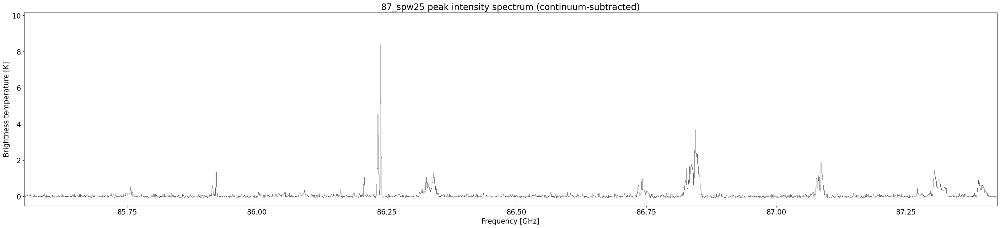

1: 89_spw27


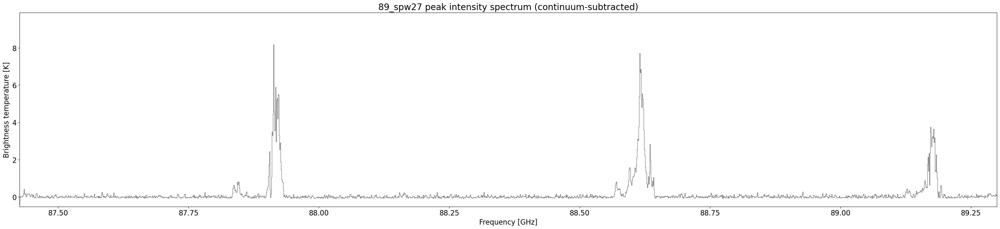

2: 91_spw25


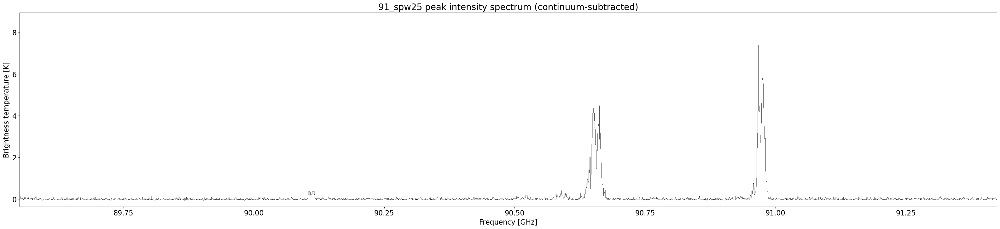

3: 93_spw27


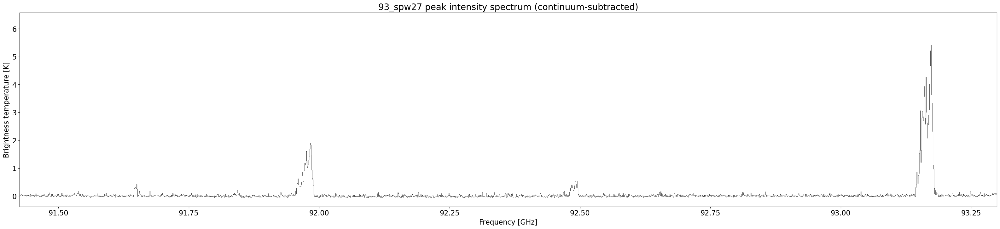

4: 95_spw25


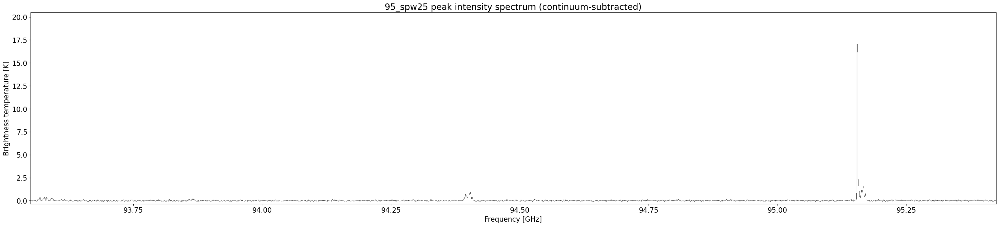

5: 97_spw27


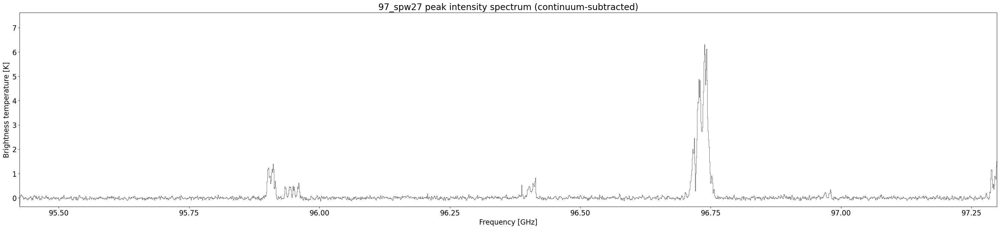

6: 98_spw29


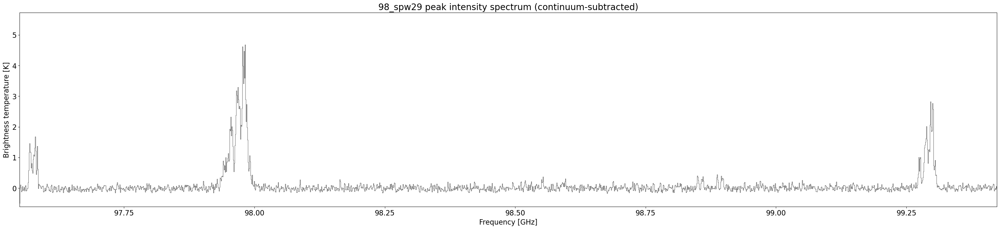

7: 99_spw31


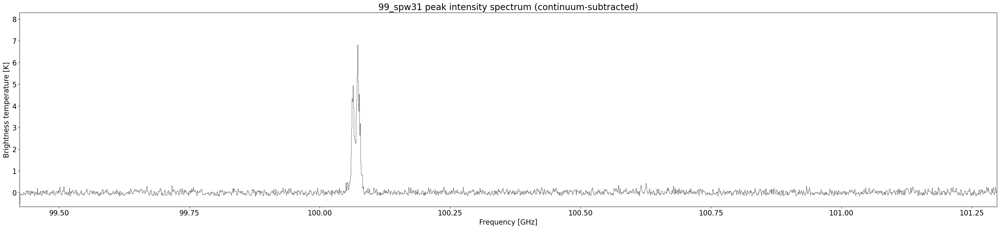

8: 102_spw23


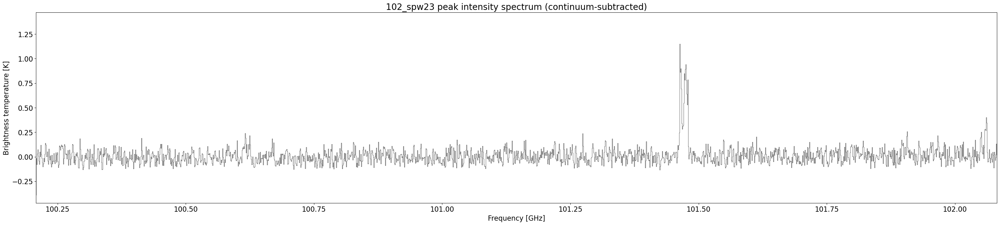

9: 102_spw29


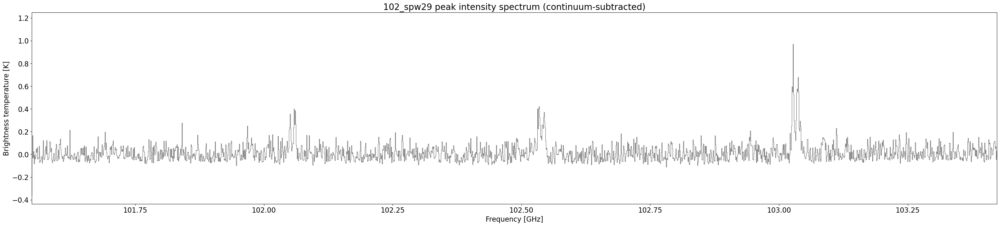

10: 103_spw31


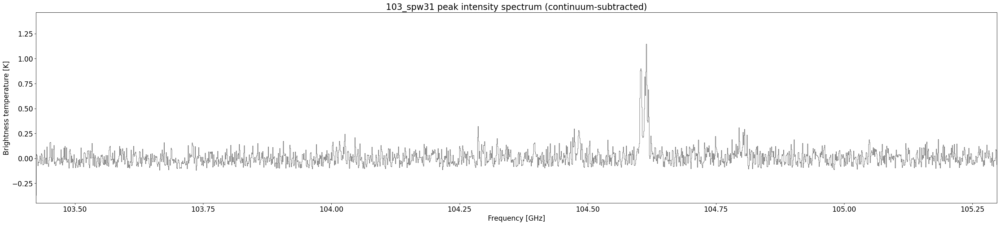

11: 106_spw29


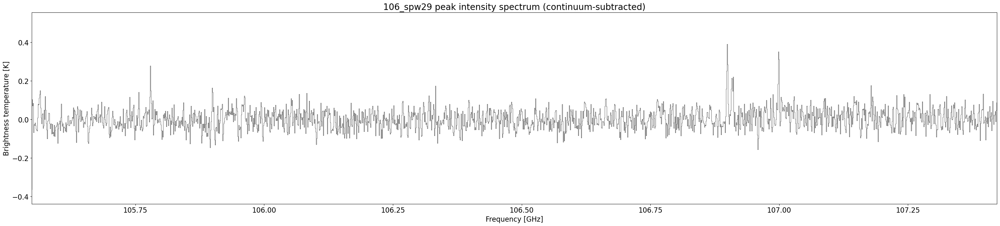

12: 107_spw31


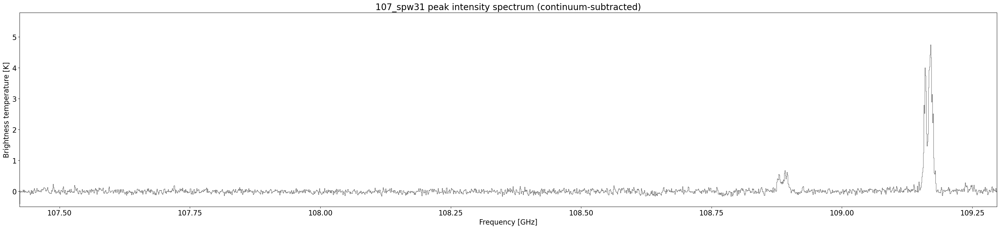

13: 110_spw29


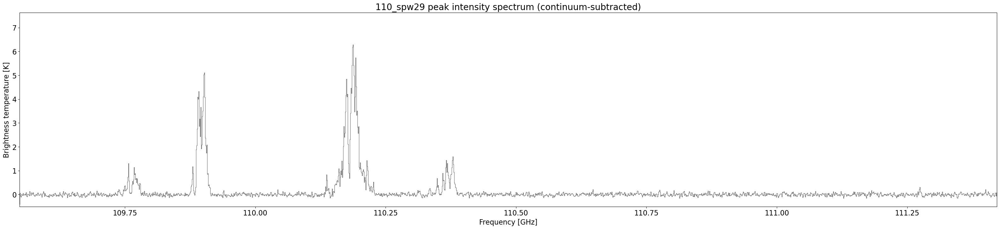

14: 111_spw31


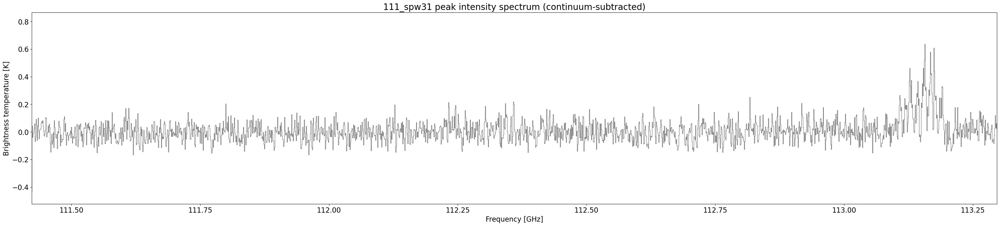

15: 112_spw27


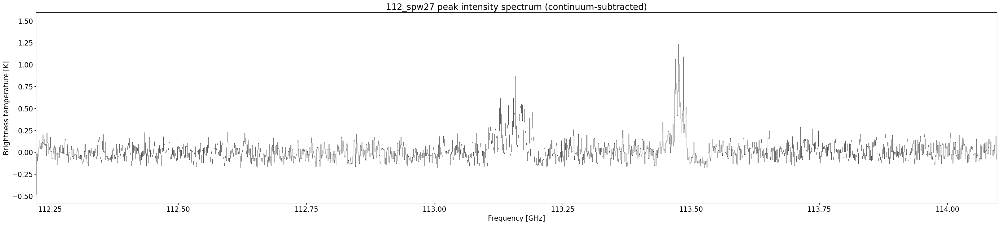

16: 114_spw29


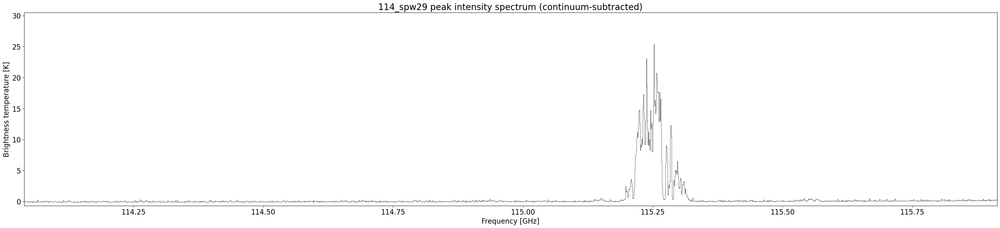

17: 127_spw65


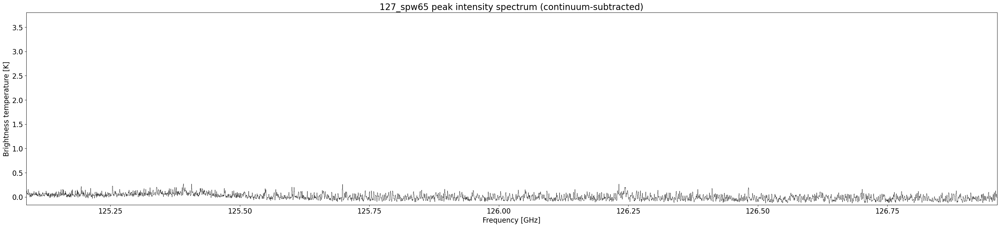

18: 129_spw67


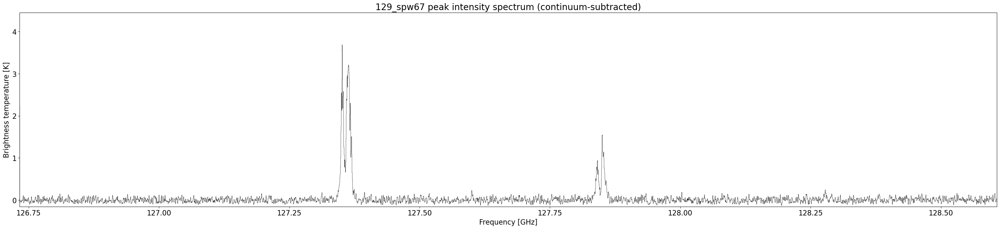

19: 130_spw105


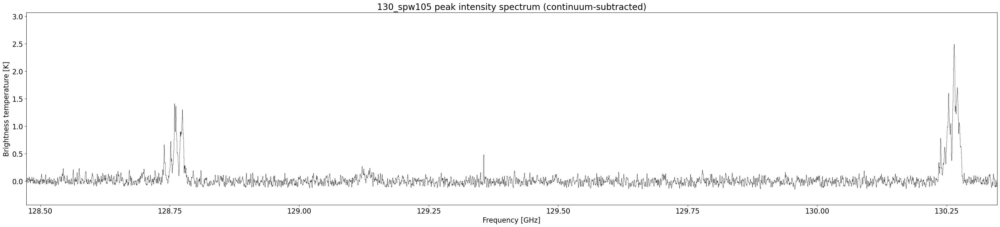

20: 132_spw107


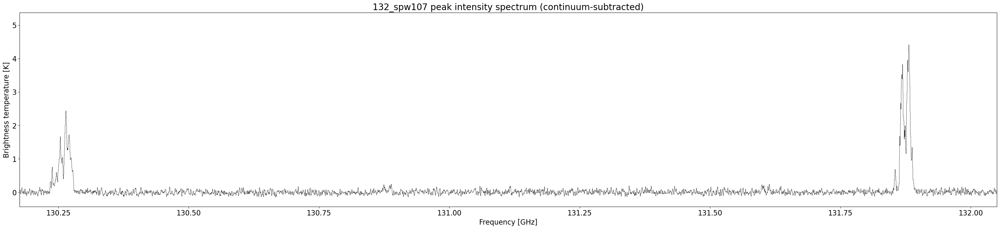

21: 134_spw45


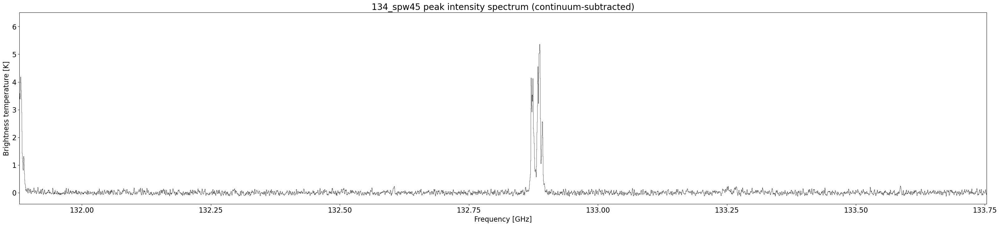

22: 135_spw47


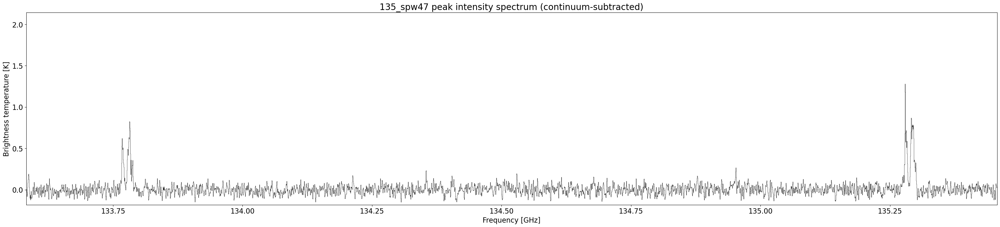

23: 137_spw85


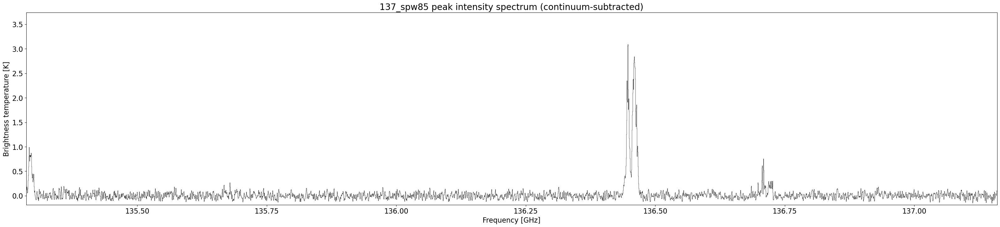

24: 137_spw69


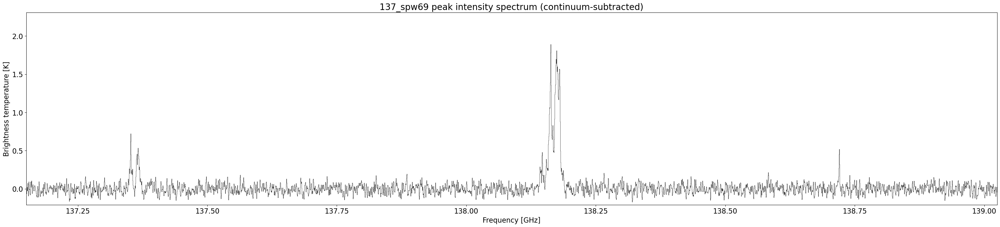

25: 139_spw71


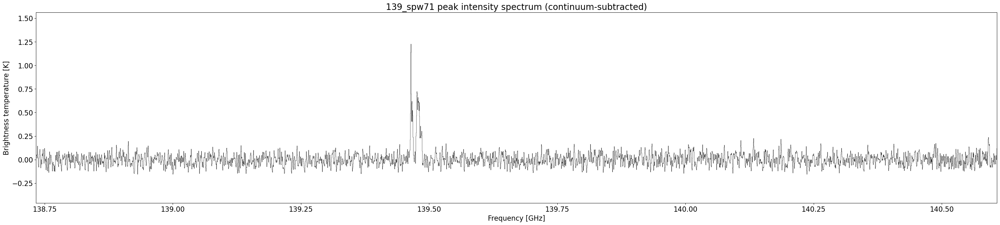

26: 140_spw109


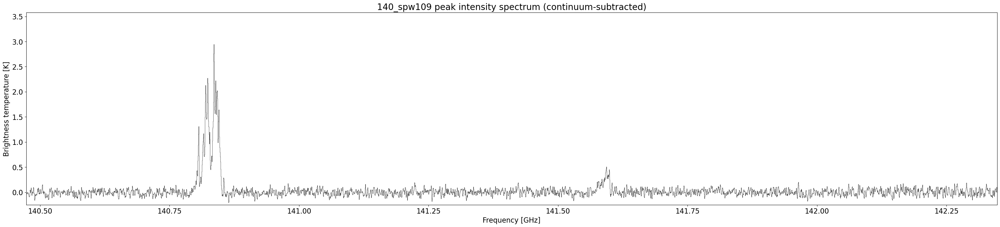

27: 142_spw111


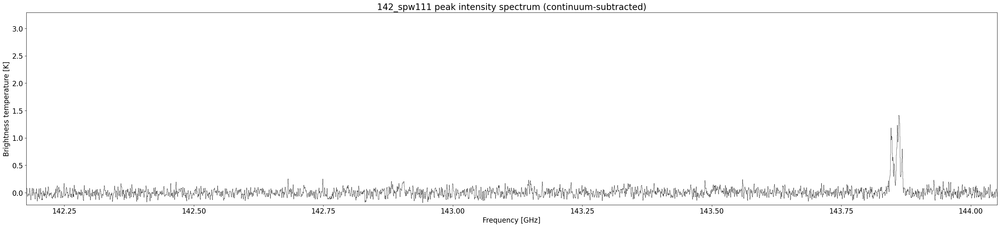

28: 144_spw49


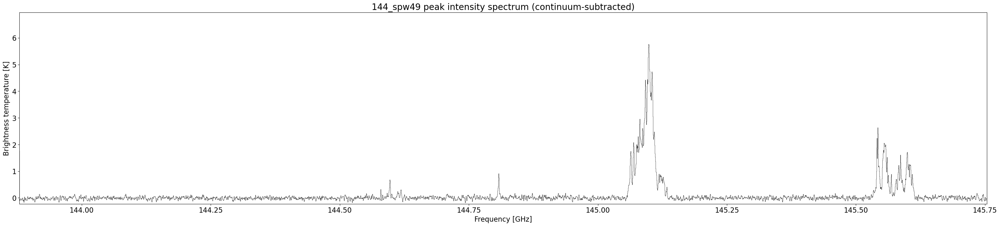

29: 146_spw51


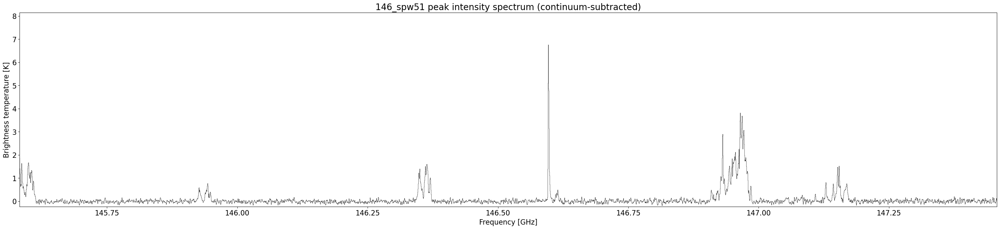

30: 147_spw89


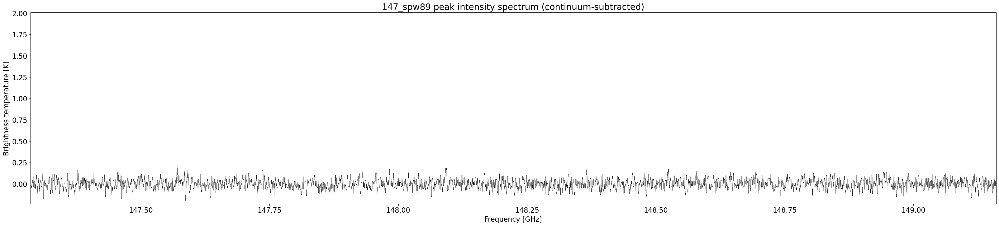

31: 149_spw91


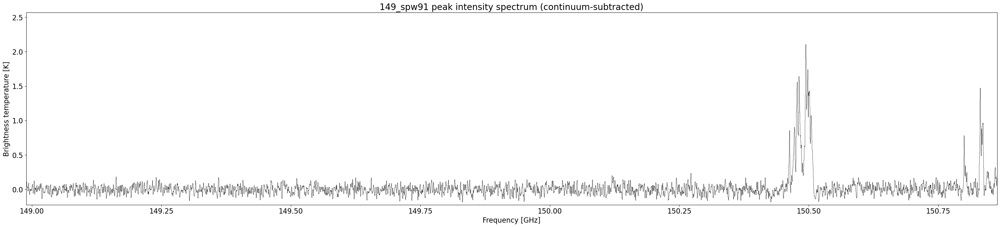

32: 142_spw27


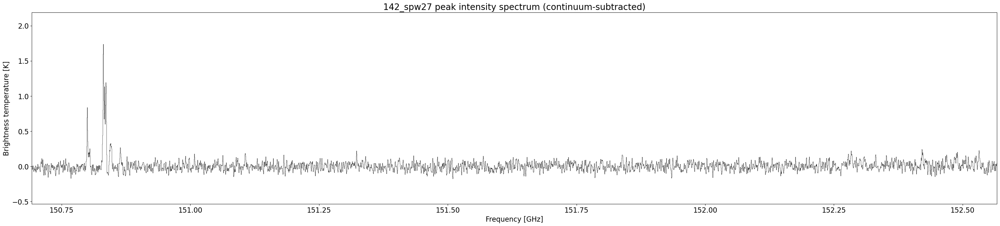

33: 152_spw31


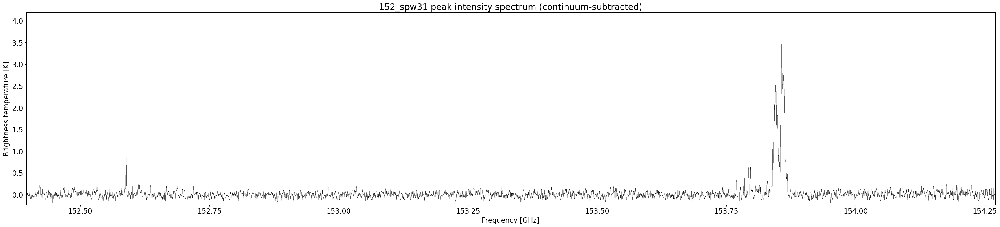

34: 244_spw65


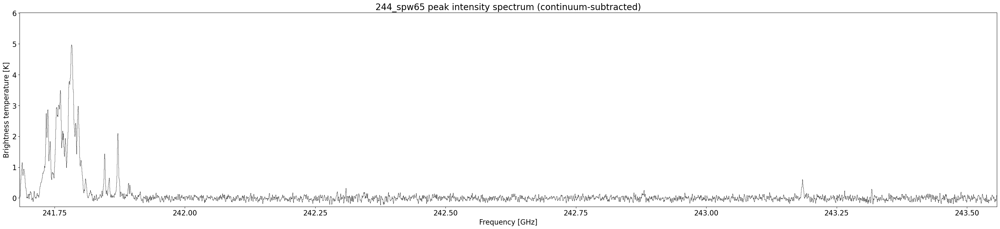

35: 245_spw67


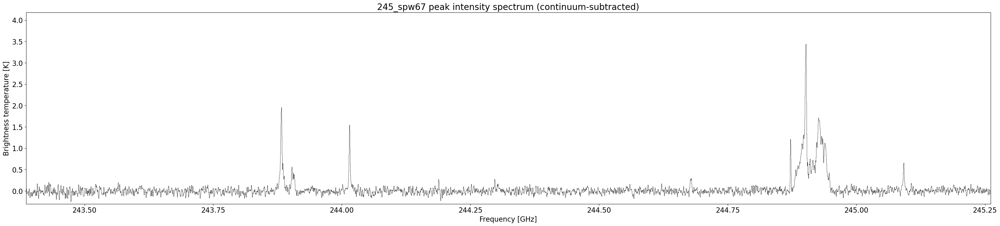

36: 247_spw105


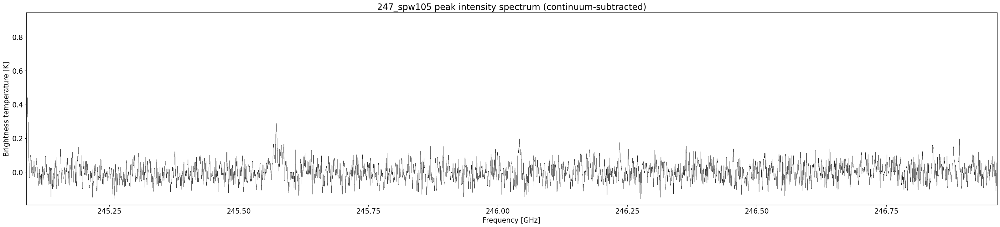

37: 249_spw107


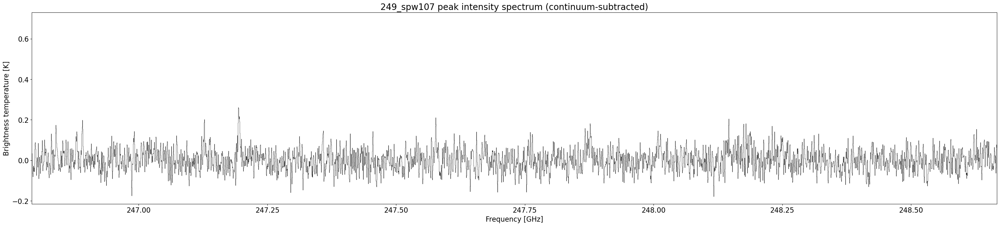

38: 250_spw25


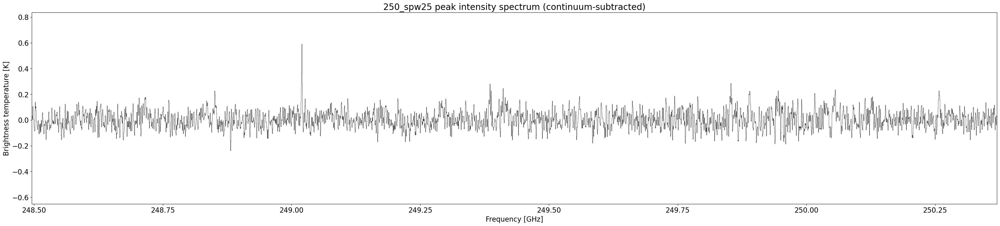

39: 252_spw27


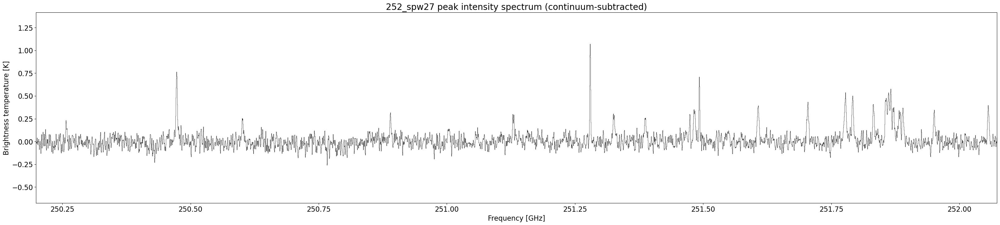

40: 254_spw85


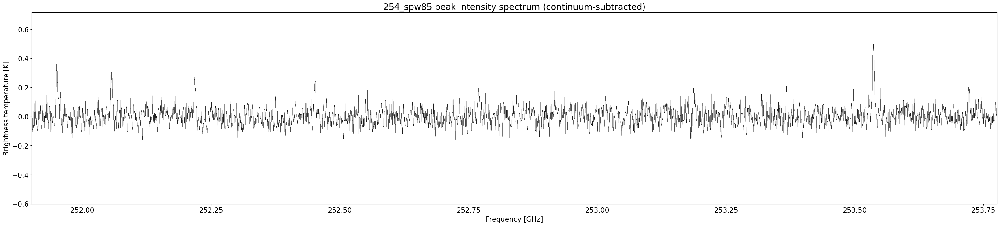

41: 255_spw87


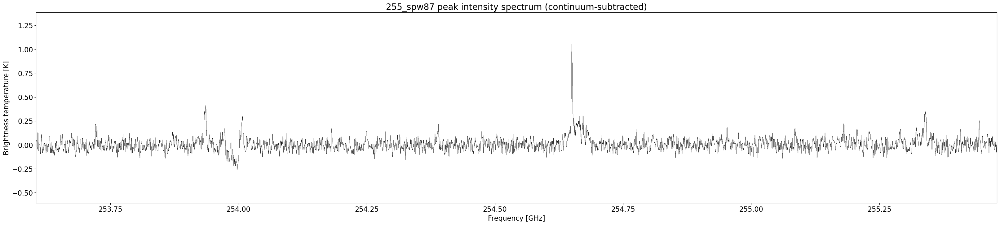

42: 257_spw45


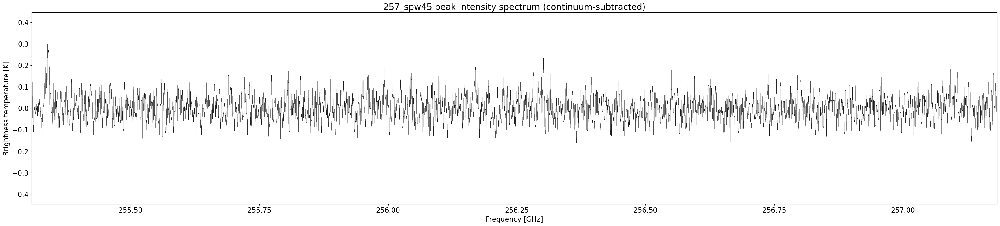

43: 258_spw69


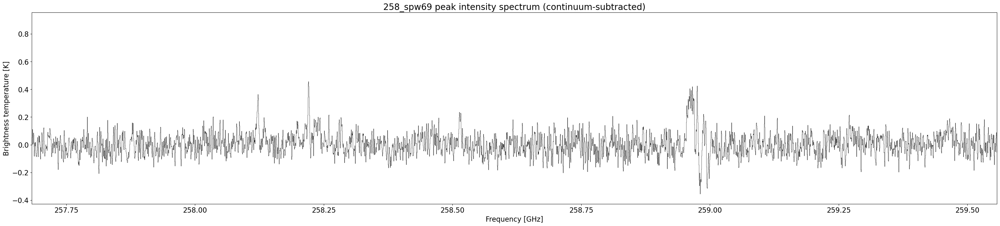

44: 259_spw47


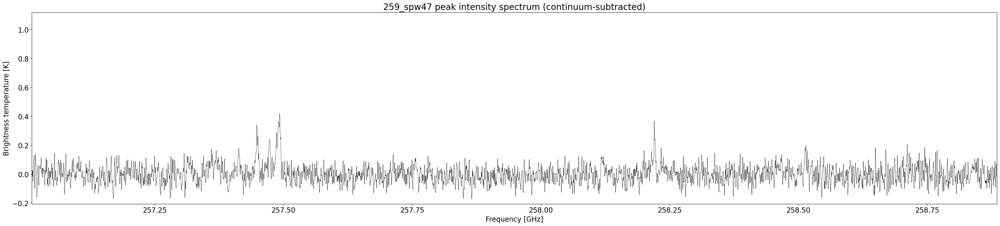

45: 259_spw71


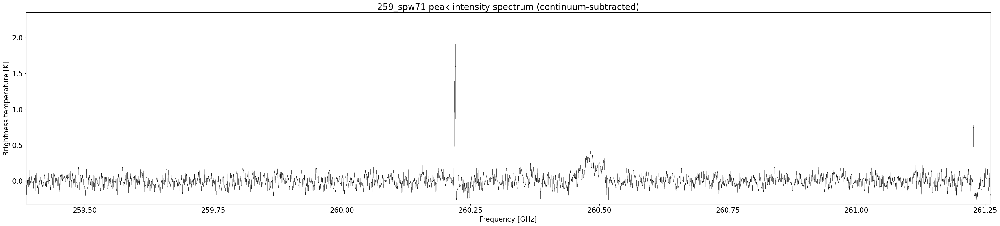

46: 261_spw109


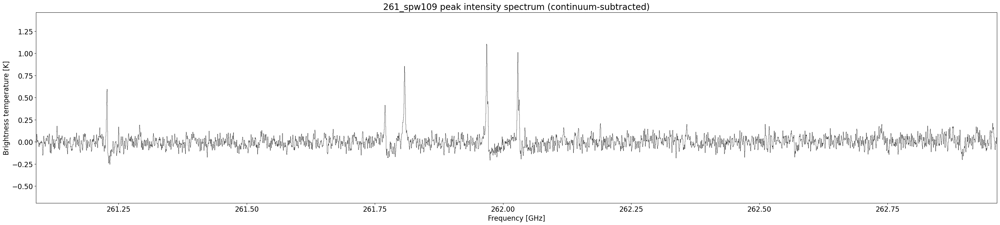

47: 263_spw111


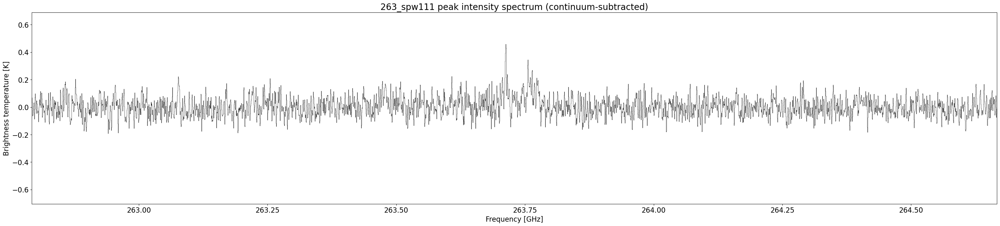

48: 264_spw29


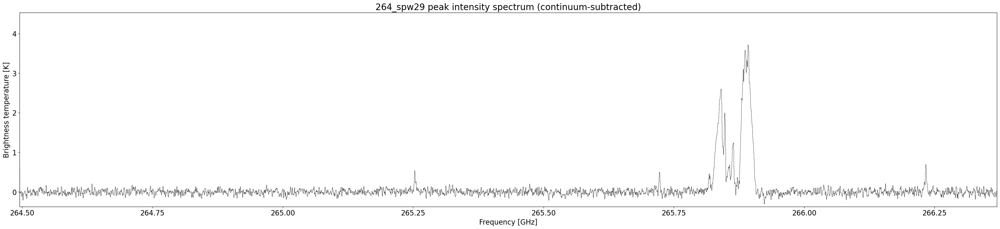

49: 266_spw31


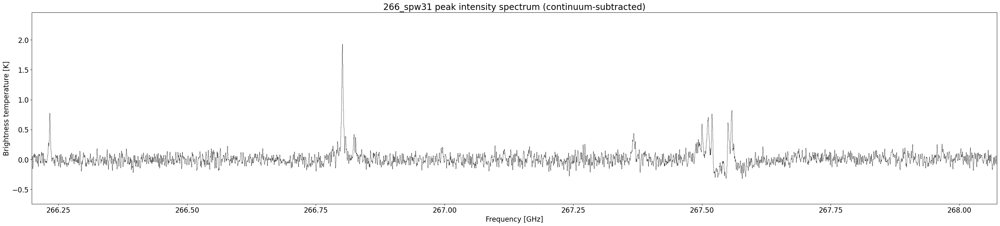

50: 268_spw89


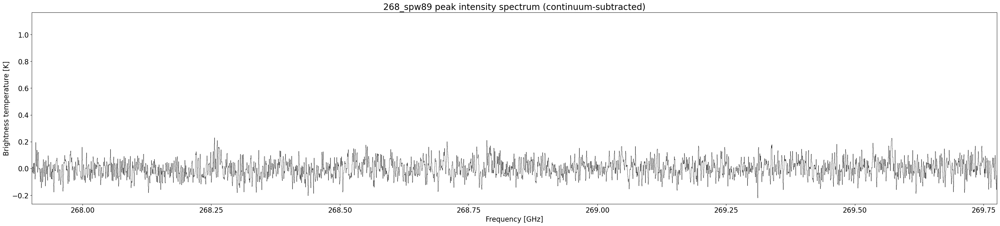

51: 270_spw91


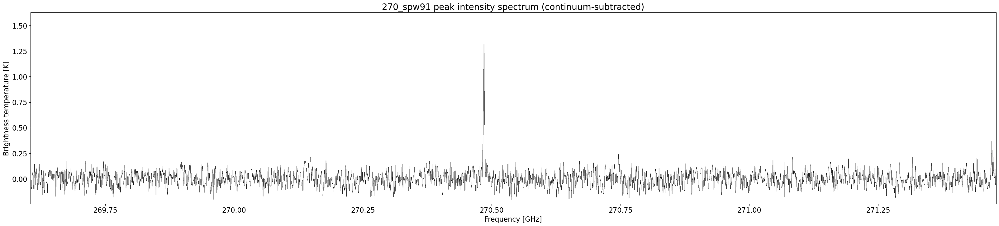

52: 271_spw49


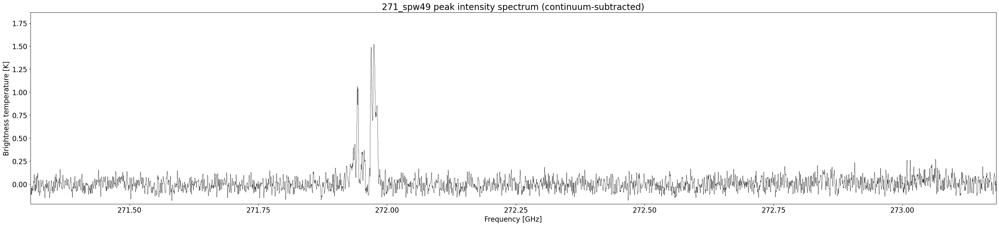

53: 273_spw51


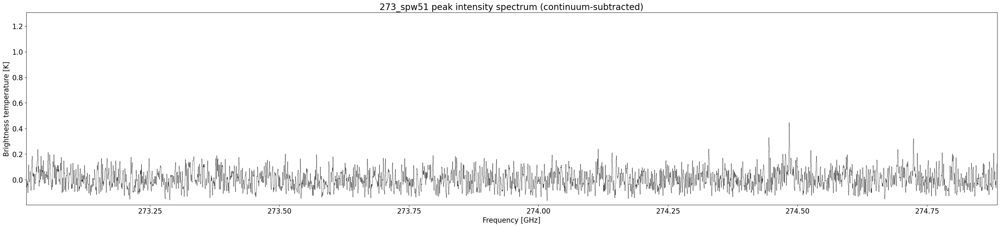

In [6]:
# from spectral_cube import SpectralCube
from astropy import coordinates
from astropy import wcs

# Create list of filenames and plot spectra
for ind, freq_spw in enumerate(freq_spws):
    print(f'{ind}: {freq_spw}')
    # Get max spectrum
    max_fn = results+'source_ab_'+freq_spw+'_clean_2sigma_n50000_masked_3sigma_pbmask0p18.max.fits'
    max_sp = OneDSpectrum.from_hdu(fits.open(max_fn)).to(u.K)
    max_sp_py = pyspeckit.Spectrum.from_hdu(max_sp.hdu)
    max_sp_py.data -= np.median(max_sp_py.data)
    max_sp_py.xarr.convert_to_unit('GHz')

    fig = plt.figure(figsize = (40, 8))

    max_sp_py.plotter(figure = fig)
    
    plt.xlabel(f"Frequency [{max_sp_py.xarr.unit}]")
    plt.ylabel(f"Brightness temperature [{max_sp_py.unit}]")
    plt.title(f"{freq_spws[ind]} peak intensity spectrum (continuum-subtracted)")
    plt.savefig(f'/blue/adamginsburg/abulatek/brick/first_results/lineID/plots_NEW/unlabeled/{freq_spw}.pdf')
    plt.savefig(f'/blue/adamginsburg/abulatek/brick/first_results/lineID/plots_NEW/unlabeled/{freq_spw}.png')
    plt.show()

In [7]:
## Set up formatting for species names
# for item in data['Species'].unique():
#     print(item)
formats = {'29SiOv=0'      : '$^{29}$SiO $v=0$', 
           'NH2D'          : 'NH$_2$D', 
           'SiOv=1'        : 'SiO $v=1$',
           'NH2CHO'        : 'NH$_2$CHO', 
           'H13CO+'        : 'H$^{13}$CO+', 
           'SiOv=0'        : 'SiO $v=0$',
           'HN13C'         : 'HN$^{13}$C',
           'CCHv=0'        : 'CCH $v=0$',
           'HNCOv=0'       : 'HNCO $v=0$',
           'H13CCCNv=0'    : 'H$^{13}$CCCN $v=0$',
           'HCNv=0'        : 'HCN $v=0$', 
           'HCO+v=0'       : 'HCO+ $v=0$', 
           'C2H5OH'        : 'C$_2$H$_5$OH', 
           'HNCv=0'        : 'HNC $v=0$', 
           'HC3Nv=0'       : 'HC$_3$N $v=0',
           '(CH3)2COv=0'   : '(CH$_3$)$_2$CO $v=0$',
           'CH3CN'         : 'CH$_3$CN $v=0$', # This exists in addition to one without v=0 (my fault), have combined by changing this one's mapping
           '13CSv=0'       : '$^{13}$CS $v=0$',
           'N2H+v=0'       : 'N$_2$H+ $v=0$',
           'CH3OHvt=0-2'   : 'CH$_3$OH $vt=0-2$', 
           'CH3CHOv=0,1&2' : 'CH$_3$CHO $vt=0,1,&2$',
           'CCS'           : 'CCS',
           '13CH3OHvt=0'   : '$^{13}$CH$_3$OH $v=0$',
           'CH3OCHOv=0'    : 'CH$_3$OCHO $v=0$',
           'O13CS'         : 'O$^{13}$CS', 
           'OCSv=0'        : 'OCS $v=0$', 
           'H213CS'        : 'H$_2^{13}$CS', 
           '34SO'          : '$^{34}$SO',
           'CSv=0'         : 'CS $v=0$',
           'CH3OCH3'       : 'CH$_3$OCH$_3$',
           'SO3&Sigma;v=0' : 'SO $v=0$',
           'NH2CN'         : 'NH$_2$CN',
           'H2CS'          : 'H$_2$CS', 
           'H2COH+'        : 'H$_2$COH+',
           'CH3CCHv=0'     : 'CH$_3$CCH $v=0$',
           'SO2v=0'        : 'SO$_2$ $v=0$', 
           '?'             : '?',
           'UnidentifiedTransition' : 'Unidentified Transition',
           'CH2NH'         : 'CH$_2$NH',
           'HOCO+'         : 'HOCO+',
           'CH3CH213CN'    : 'CH$_3$CH$_2^{13}$CN',
           '13CN'          : '$^{13}$CN',
           'C18O'          : 'C$^{18}$O', 
           '13COv=0'       : '$^{13}$CO $v=0$', 
           'CH313CN'       : 'CH$_3^{13}$CN', 
           'C17O'          : 'C$^{17}$O', 
           'CNv=0'         : 'CN $v=0$', 
           'COv=0'         : 'CO $v=0$', 
           'NS,v=0'        : 'NS $v=0$',
           'CH3CNv=0'      : 'CH$_3$CN $v=0$', # This exists in addition to one without v=0 (my fault), see above
           'H213CO'        : 'H$_2^{13}$CO',
           'H2CO'          : 'H$_2$CO',
           'C34Sv=0'       : 'C$^{34}$S $v=0$',
           'DCNv=0'        : 'DCN $v=0$',
           'c-HCCCHv=0'    : 'c-HCCCH $v=0$',
           'CH3NH2'        : 'CH$_3$NH$_2$',
           '34SO2v=0'      : '$^{34}$SO$_2$ $v=0$', 
           'OS17O'         : 'OS$^{17}$O',
           'HC3Nv=0'       : 'HC$_3$N $v=0$',
           'CH3CNv8=1'     : 'CH$_3$CN $v8=1$', 
           'HC15Nv=0'      : 'HC$^{15}$N $v=0$',
           'CH2CHCNv=0'    : 'CH$_2$CHCN $v=0$',
           'H13CNv=0'      : 'H$^{13}CN $v=0$', 
           'HDCO'          : 'HDCO',
           'HCNv2=1'       : 'HCN $v2=1$', 
           'nan'           : 'nan',
          }

### 3. Plot all labeled peak intensity spectra

0: 87_spw25


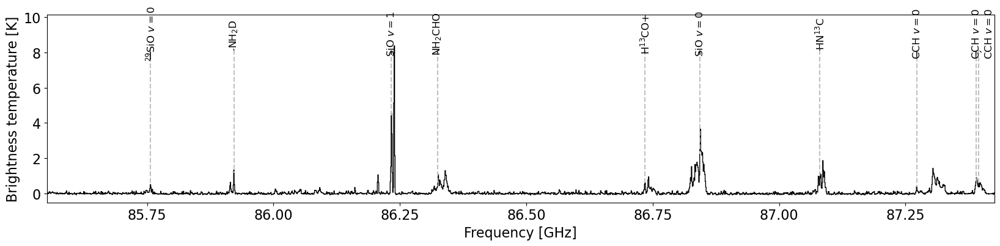

1: 89_spw27


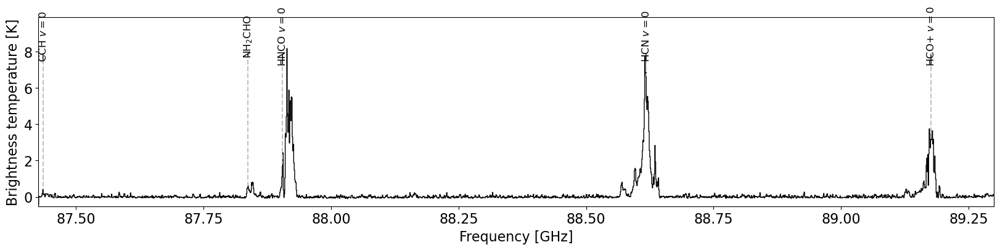

2: 91_spw25


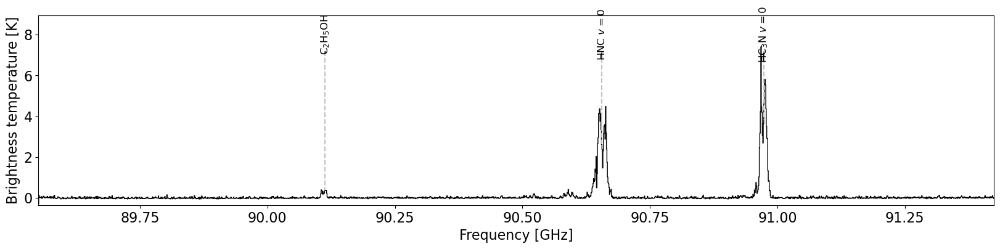

3: 93_spw27


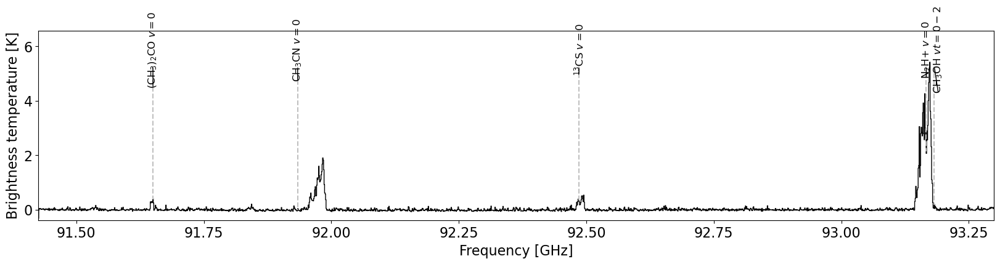

4: 95_spw25


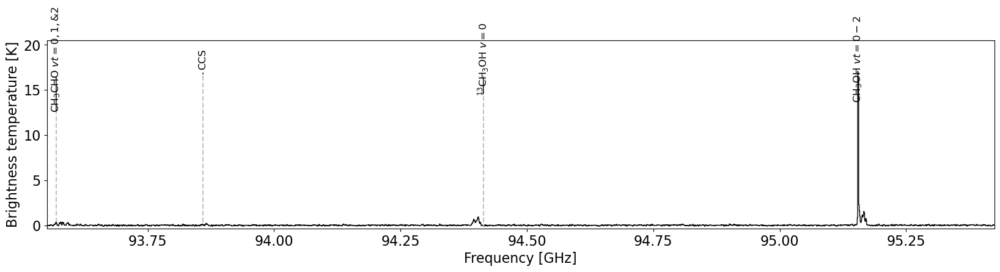

5: 97_spw27


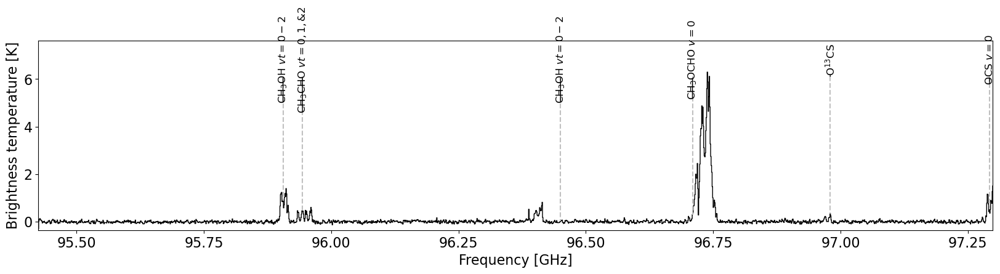

6: 98_spw29


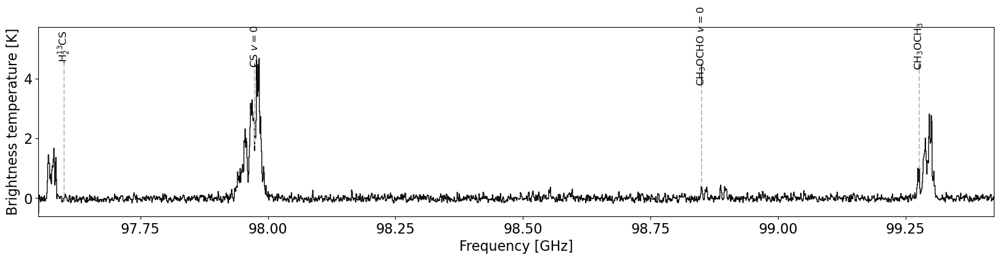

7: 99_spw31


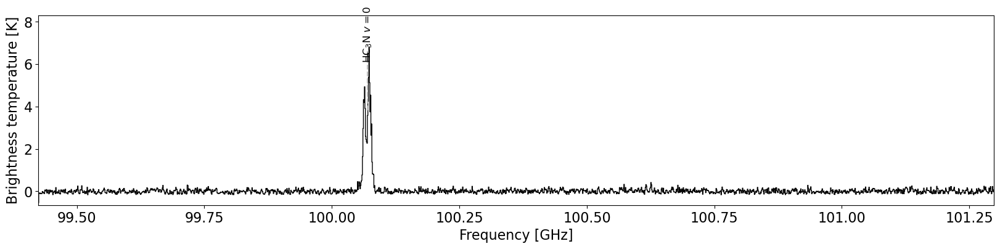

8: 102_spw23


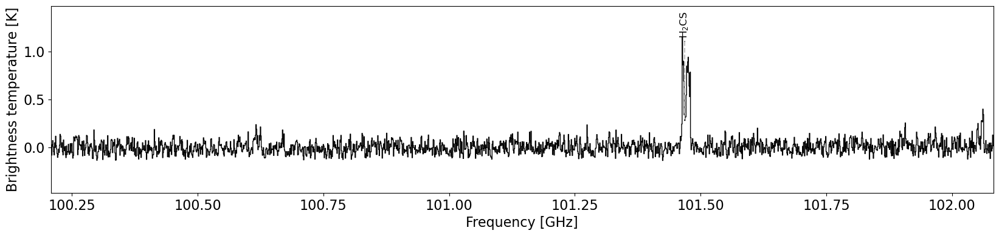

9: 102_spw29


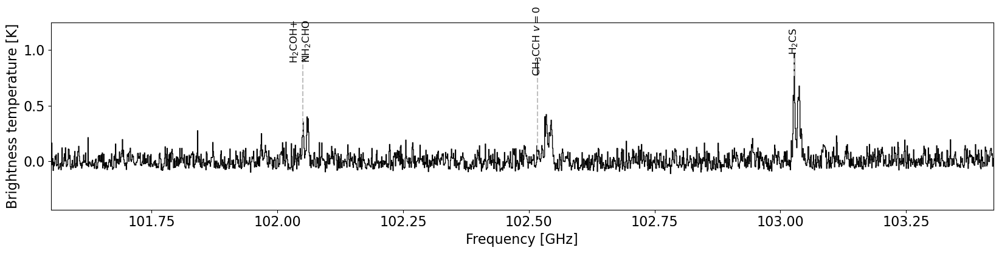

10: 103_spw31


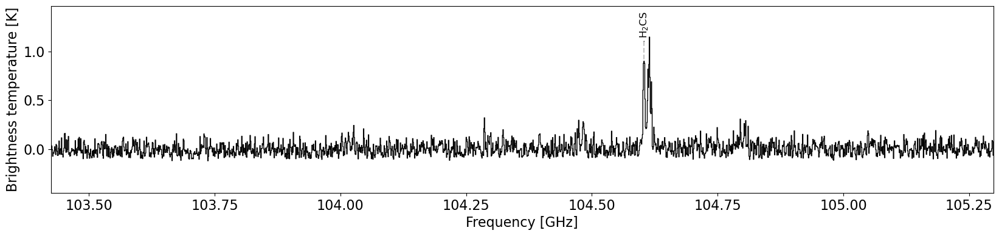

11: 106_spw29


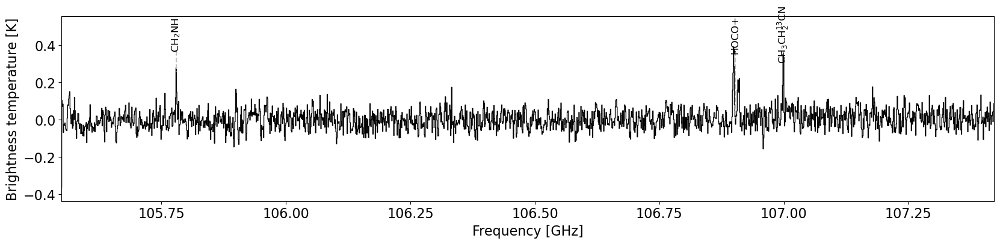

12: 107_spw31


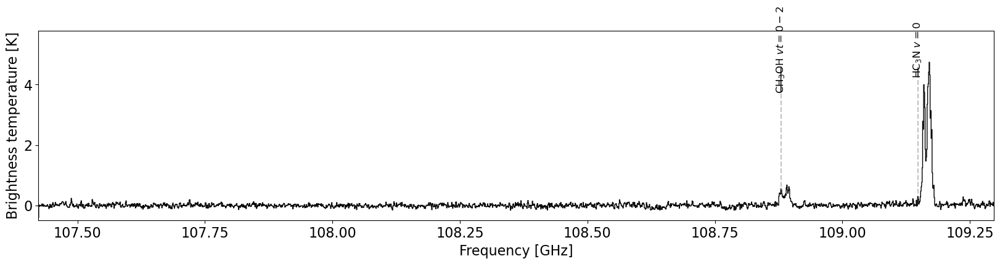

13: 110_spw29


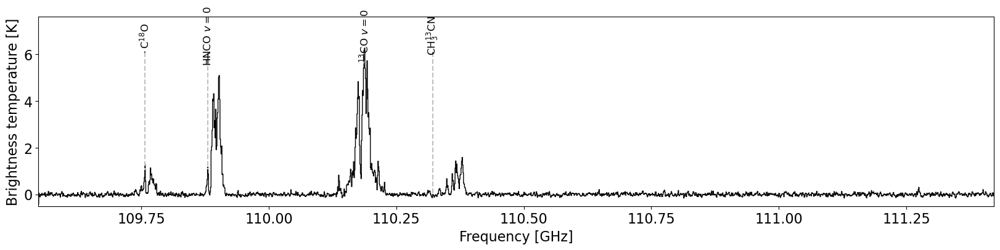

14: 111_spw31


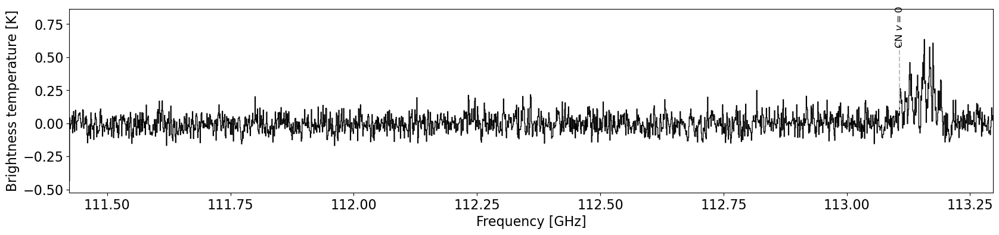

15: 112_spw27


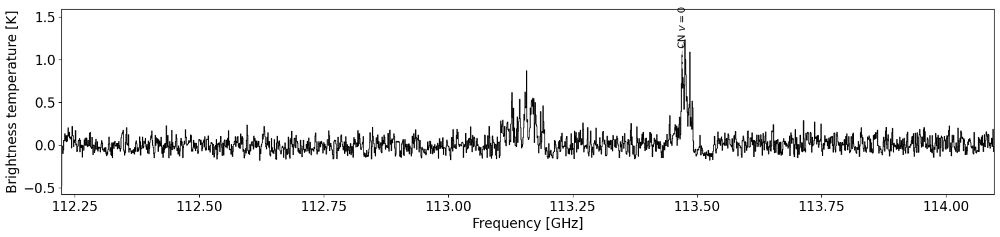

16: 114_spw29


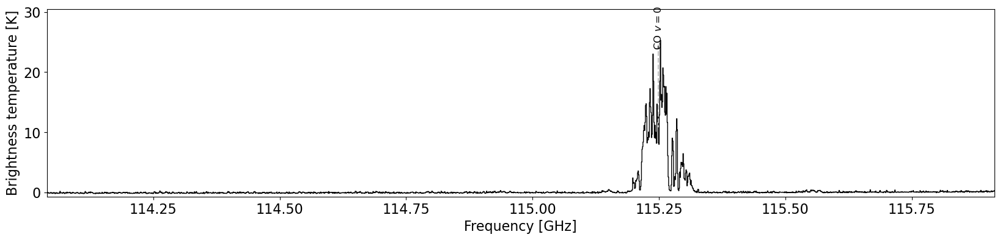

17: 127_spw65


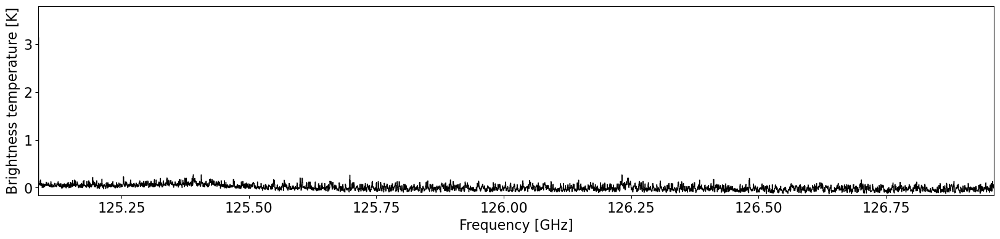

18: 129_spw67


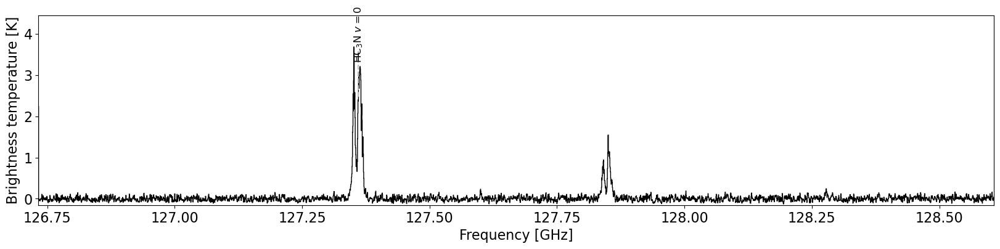

19: 130_spw105


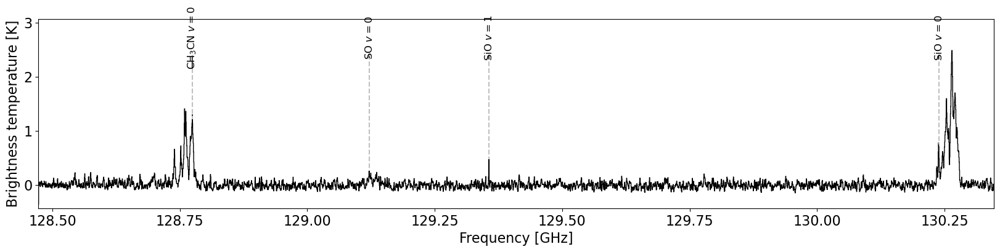

20: 132_spw107


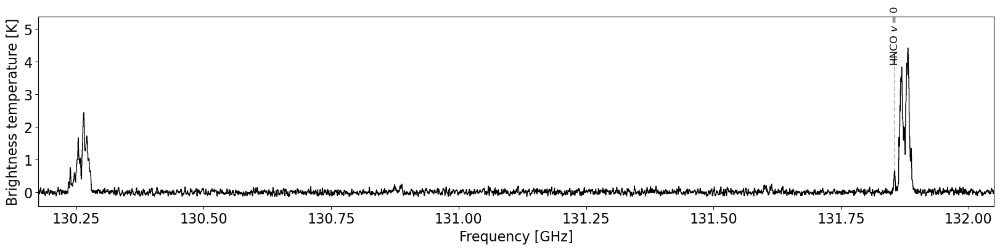

21: 134_spw45


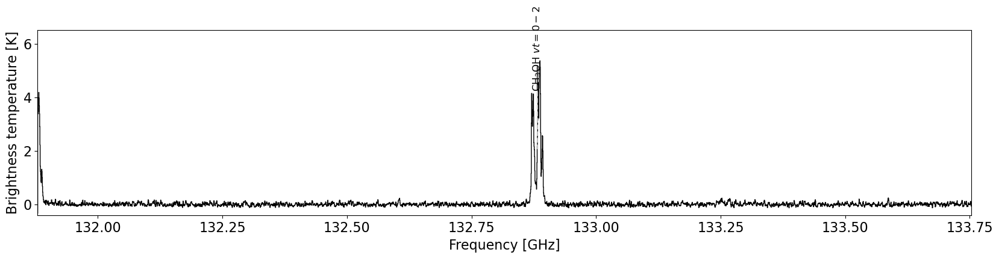

22: 135_spw47


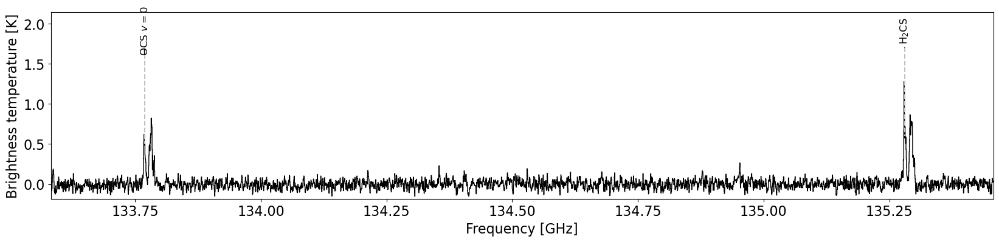

23: 137_spw85


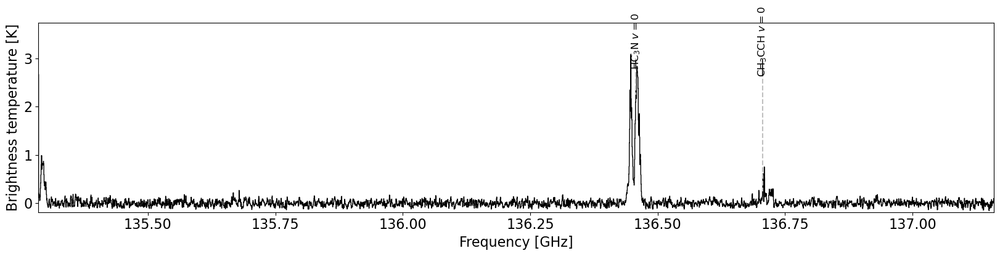

24: 137_spw69


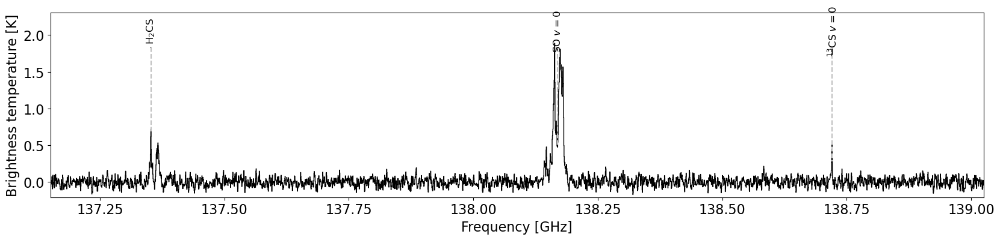

25: 139_spw71


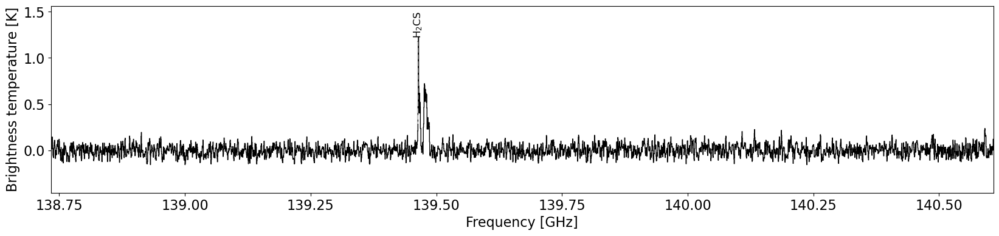

26: 140_spw109


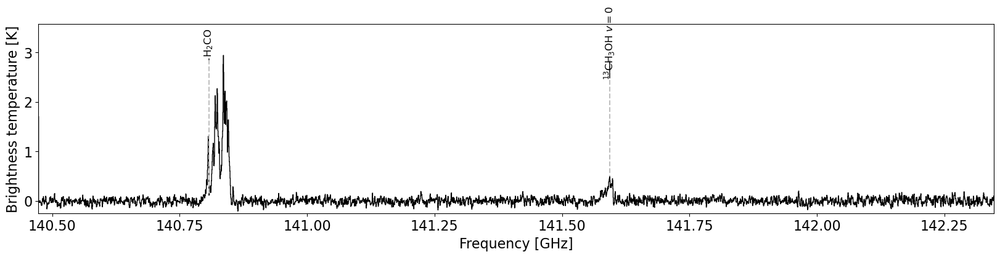

27: 142_spw111


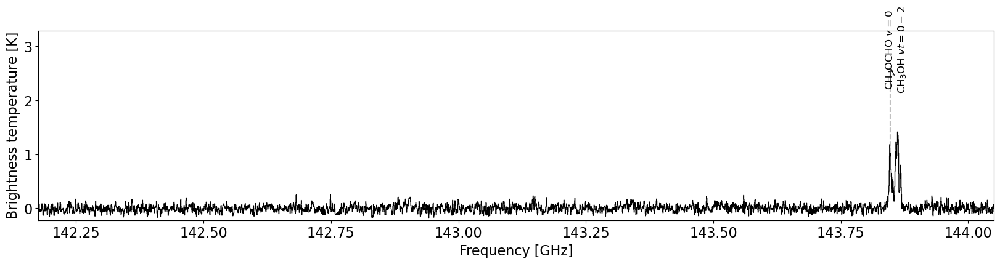

28: 144_spw49


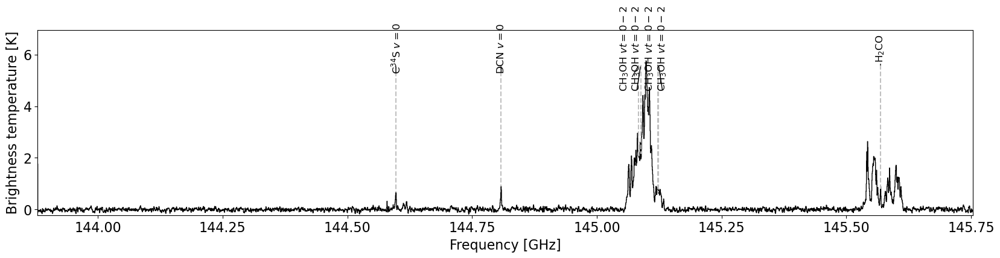

29: 146_spw51


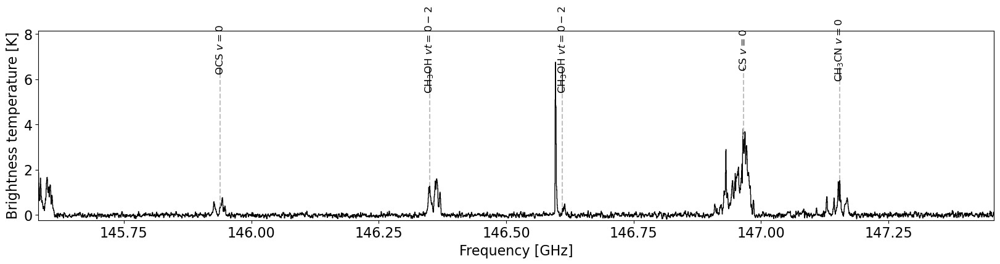

30: 147_spw89


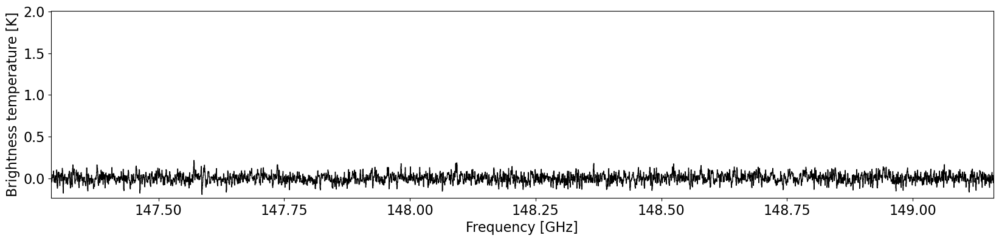

31: 149_spw91


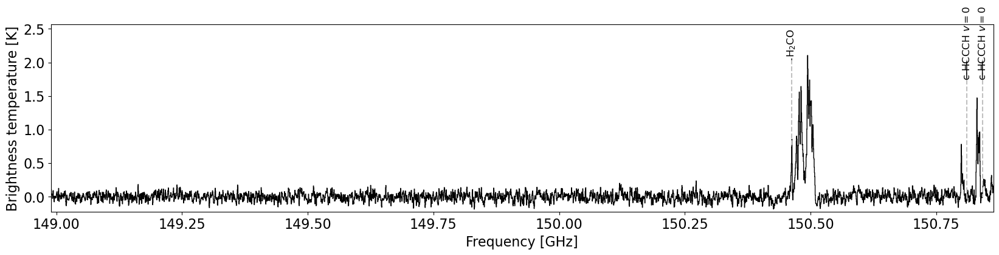

32: 142_spw27


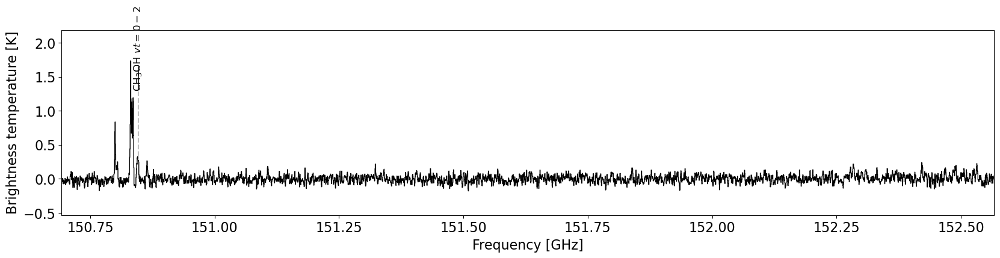

33: 152_spw31


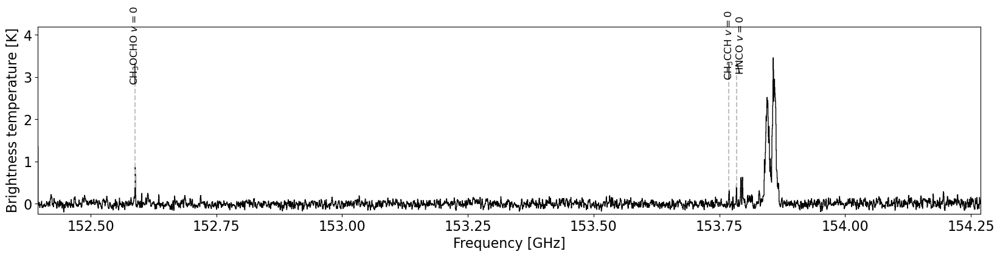

34: 244_spw65


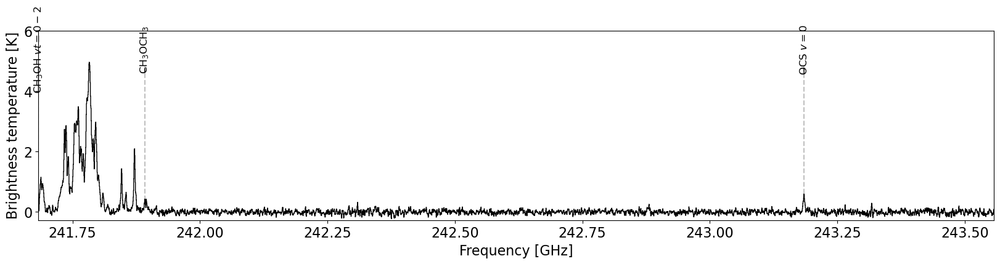

35: 245_spw67


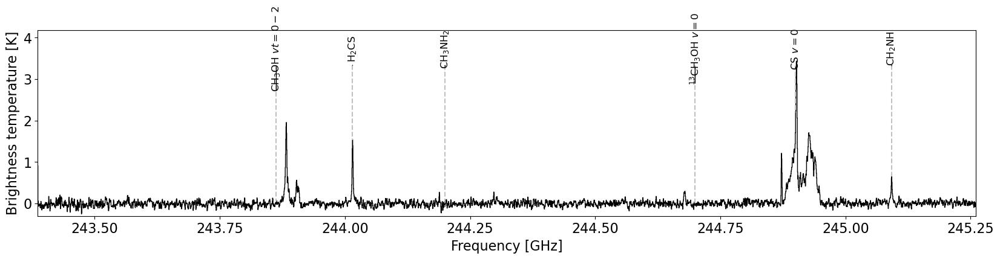

36: 247_spw105


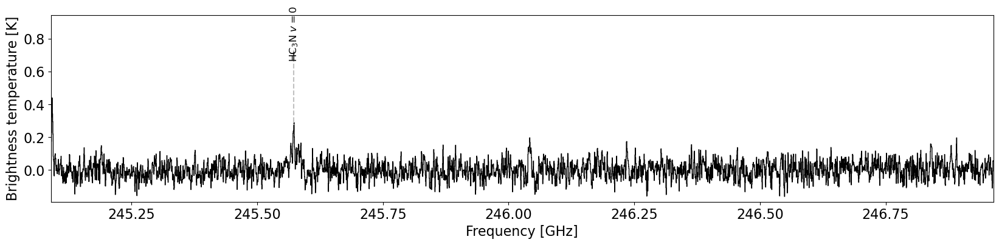

37: 249_spw107


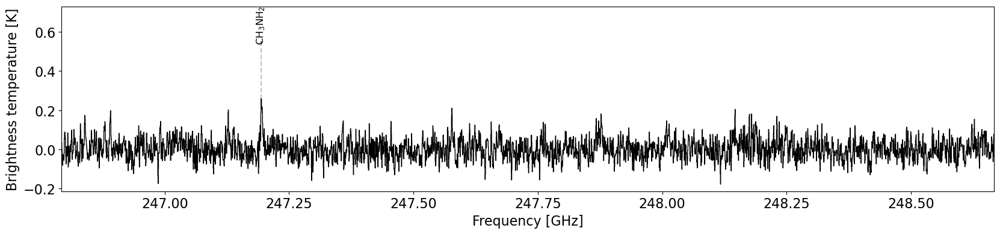

38: 250_spw25


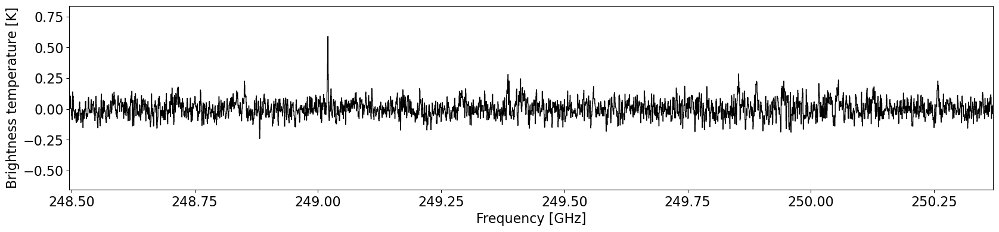

39: 252_spw27


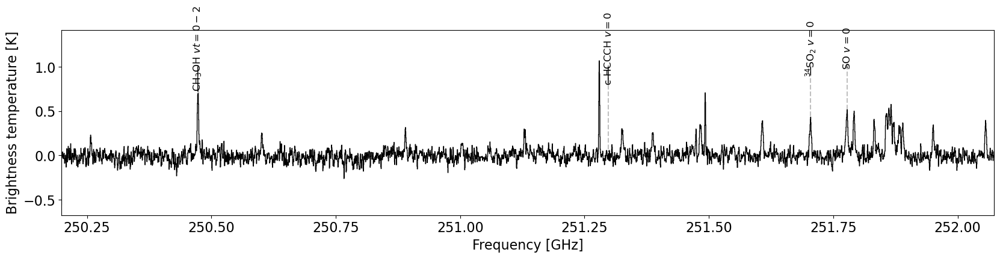

40: 254_spw85


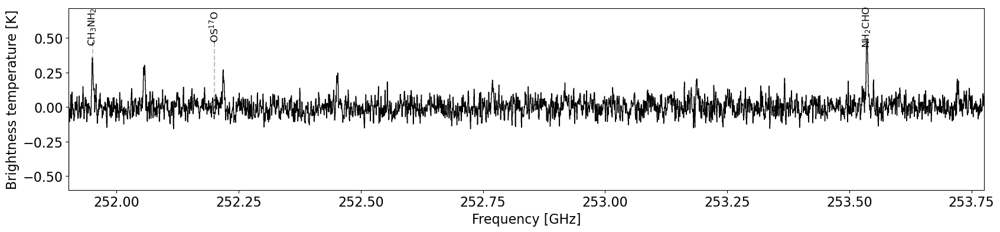

41: 255_spw87


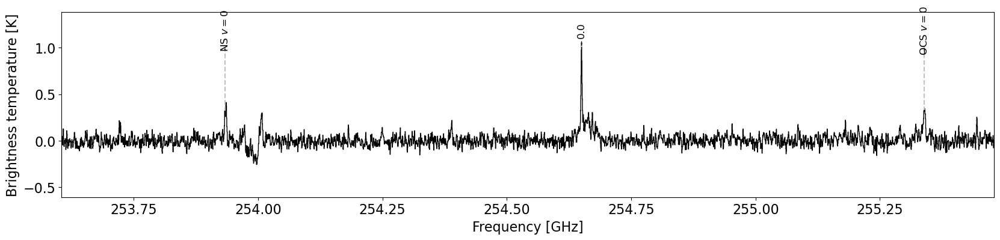

42: 257_spw45


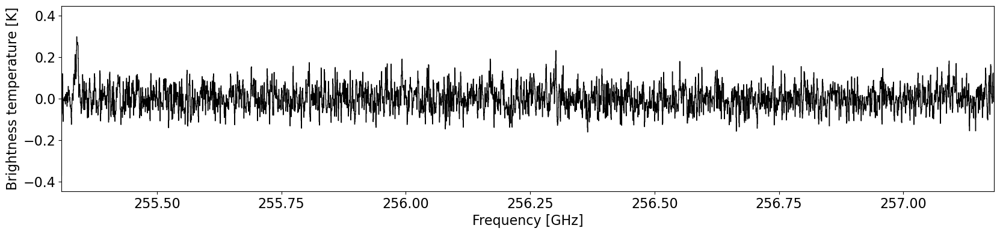

43: 258_spw69


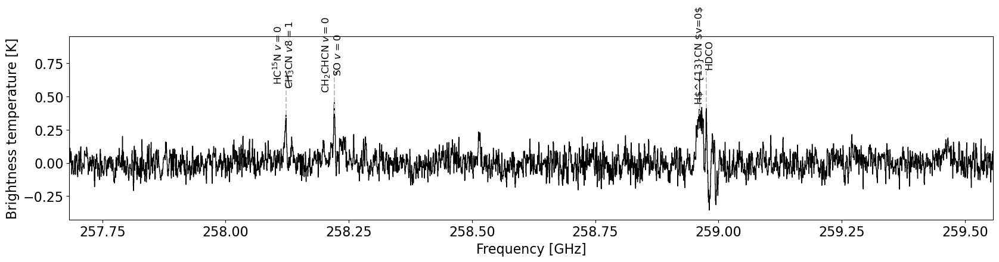

44: 259_spw47


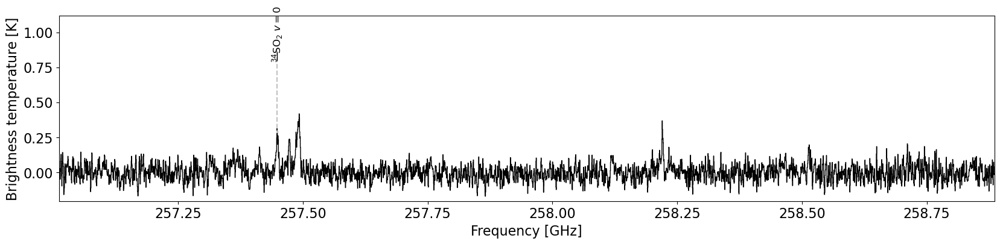

45: 259_spw71


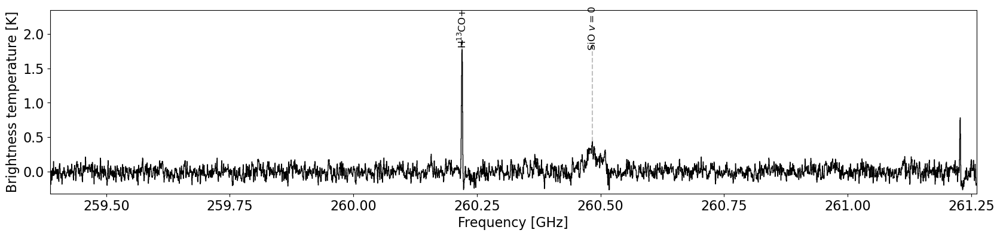

46: 261_spw109


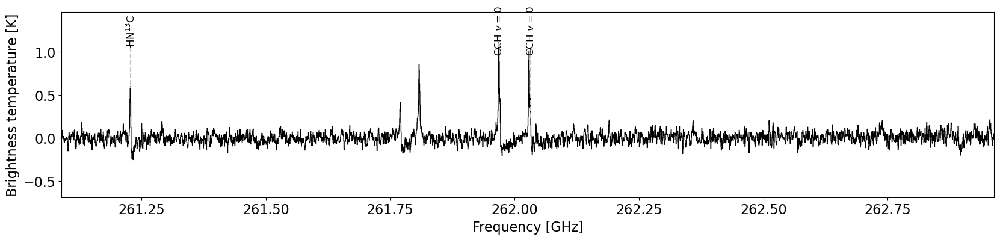

47: 263_spw111


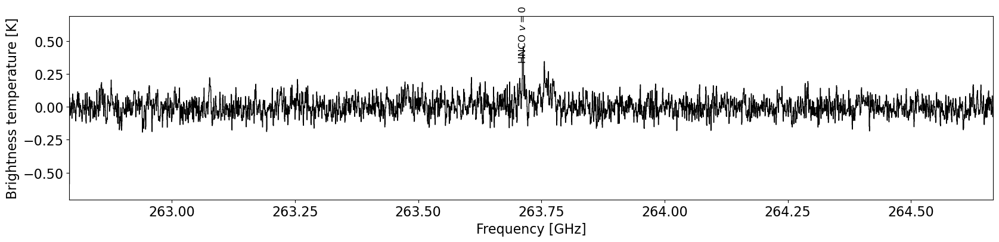

48: 264_spw29


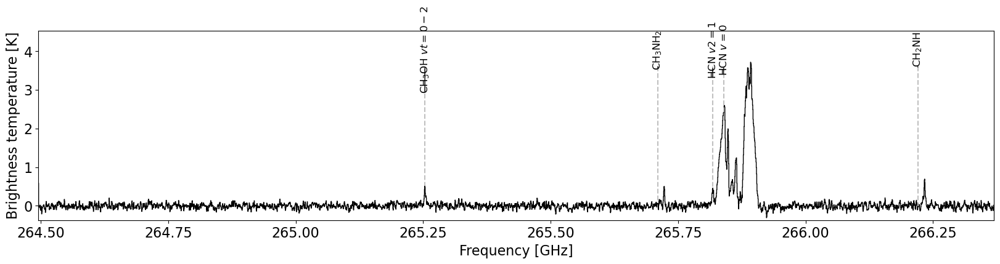

49: 266_spw31


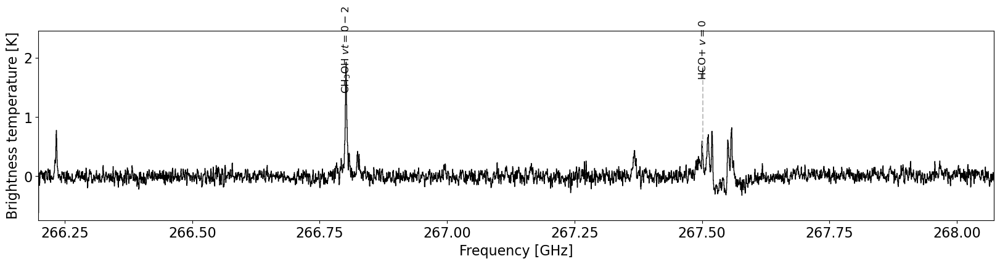

50: 268_spw89


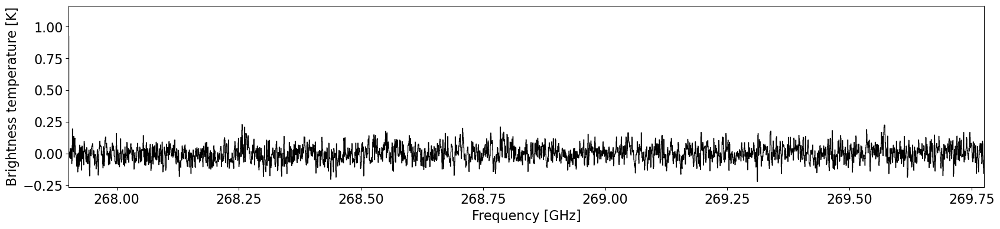

51: 270_spw91


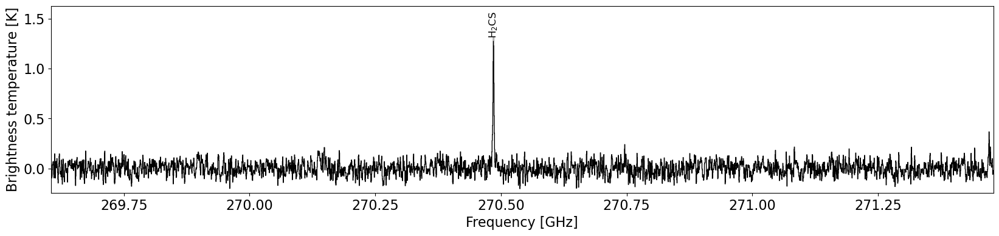

52: 271_spw49


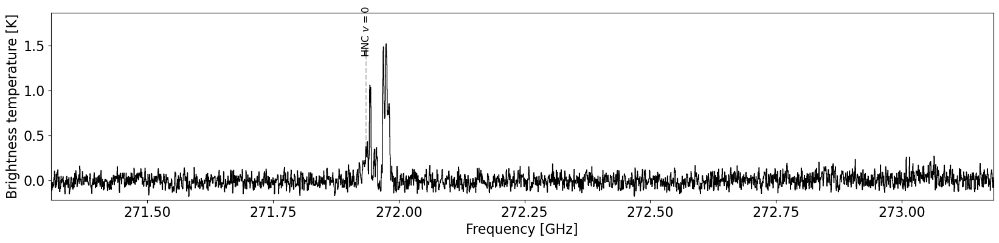

53: 273_spw51


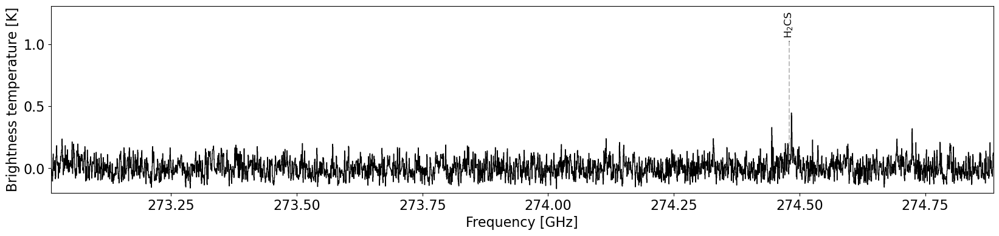

In [8]:
import pandas
from astropy.table import Table

every_line = pandas.read_csv('/blue/adamginsburg/abulatek/brick/first_results/modeling/line_lists/brick_line_list.csv')
## Make new column with formatted name
every_line['Species (formatted)']= every_line['Species'].map(formats)

every_line_max = every_line[every_line['Spectrum type'].str.contains('max')] # This will catch both max-only and maxmean
every_line_max = Table.from_pandas(every_line_max)
every_line_max_by_spectrum = every_line_max.group_by(['freq_spw'])

# Plot labeled spectra
for ind, freq_spw in enumerate(freq_spws):
    print(f'{ind}: {freq_spw}')
    # Pick out IDs
    mask = every_line_max_by_spectrum.groups.keys['freq_spw'] == freq_spw
    max_ids = every_line_max_by_spectrum.groups[mask]
    
    # Get max spectrum
    max_fn = results+'source_ab_'+freq_spw+'_clean_2sigma_n50000_masked_3sigma_pbmask0p18.max.fits'
    max_sp = OneDSpectrum.from_hdu(fits.open(max_fn)).to(u.K)
    max_sp_py = pyspeckit.Spectrum.from_hdu(max_sp.hdu)
    max_sp_py.data -= np.median(max_sp_py.data)
    max_sp_py.xarr.convert_to_unit('GHz')

    fig = plt.figure(figsize = (20, 4))
    
    max_sp_py.plotter(figure = fig, linewidth = 1)
    max_sp_py.plotter.line_ids(line_names=max_ids['Species (formatted)'], # [formats[species] for species in list(max_ids['Species'])]
                               line_xvals=max_ids['Frequency (GHz)'] - (max_ids['Frequency (GHz)']*(max_ids['Velocity (km/s)']/299792.)),
                               xval_units='GHz', plot_kwargs={'color':'silver'})
    
    plt.xlabel(f"Frequency [{max_sp_py.xarr.unit}]")
    plt.ylabel(f"Brightness temperature [{max_sp_py.unit}]")
    # plt.title(f"{freq_spws[ind]} peak intensity spectrum (continuum-subtracted)")
    plt.savefig(f'/blue/adamginsburg/abulatek/brick/first_results/lineID/plots_NEW/labeled/{freq_spw}_labels.pdf')
    plt.savefig(f'/blue/adamginsburg/abulatek/brick/first_results/lineID/plots_NEW/labeled/{freq_spw}_labels.png')
    plt.show()